This notebook allows us to plot a latent state on a posttrial. The colors depend of the manual score associated to the epoch.
You can use results of a run on a posttrial (with or without artefact and TS epochs).




In [1]:
#Path to the latentStates.npz, uniqueStates.npz and obsKeys.npz files from a run on a posttrial
file_path_pt = '/content/drive/My Drive/Donders/OS_Basic_RGS14/TD_OS_Basic_RGS14_Control_W35_N40_R25_total_144000/RGS14_Rat1_SD1_CON_2_posttrial5/all_AWNTR'

#Path to the raw hpc, pfc and states data of the posttrial
path_to_raw_data = '/content/drive/My Drive/Donders/OS_Basic_RGS14/TD_OS_Basic_RGS14_Control_W35_N40_R25_total_144000/RGS14_Rat1_SD1_CON_2_posttrial5'

#Path to the hdf5 file
path_to_hdf5 = '/content/drive/My Drive/Donders/OS_Basic_RGS14/TD_OS_Basic_RGS14_Control_W35_N40_R25_total_144000/OS_RGS.h5'

dataset = "RGS14" #OS_Basic, RGS14 or CBD
rat_number = 1
posttrial_name = "Rat1_SD1_CON_2_posttrial5"

fs = 1000 # EEG sampling frequency

window_length = 2*fs
epoch_length = int(window_length/fs)

#Libraries

In [2]:
import pandas as pd
import numpy as np
from scipy.stats import mode
from scipy.io import loadmat
from math import *
import matplotlib.pyplot as plt
import os
import h5py
import plotly.subplots as sp
import plotly.graph_objects as go
from scipy import signal
from scipy.signal import savgol_filter
from scipy.signal import iirdesign
from scipy.signal import butter, filtfilt

In [3]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


#Loading Data

In [4]:
latent_states_pt = np.load(file_path_pt + '/latentStates.npz')
unique_states_pt = np.load(file_path_pt + '/uniqueStates.npz')
obs_keys_pt = np.load(file_path_pt + '/obsKeys.npz')

In [5]:
inferredStates_pt = latent_states_pt['inferredStates']
uniqueStates_pt = unique_states_pt['uniqueStates']
obsKeys_pt = obs_keys_pt['obsKeys']

manualStates_pt = inferredStates_pt[:, 1]
latentStates_pt = inferredStates_pt[:, 0]

nLS_pt = uniqueStates_pt.shape[0]
LS_pt = [f"LS-{i+1}" for i in range(nLS_pt)]

In [6]:
uniqueStatesStr_pt = [''.join(map(str, row[13:].astype(int))) for row in uniqueStates_pt]

In [7]:
inferredStates_pt.shape, uniqueStates_pt.shape, manualStates_pt.shape, latentStates_pt.shape, obsKeys_pt.shape

((5408, 2), (72, 23), (5408,), (5408,), (5408, 5))

In [8]:
hpc_data =  loadmat(path_to_raw_data + '/Rat1_SD1_CON_2_posttrial5_HPC')
hpc_data = hpc_data['HPC']
hpc_data = hpc_data[8*fs:]
raw_hpc = np.ravel(hpc_data)

pfc_data =  loadmat(path_to_raw_data + '/Rat1_SD1_CON_2_posttrial5_PFC')
pfc_data = pfc_data['PFC']
pfc_data = pfc_data[8*fs:]
raw_pfc = np.ravel(pfc_data)

In [9]:
with h5py.File(path_to_hdf5, 'r') as hdf:
    group = hdf[dataset][f"Rat{rat_number}"][posttrial_name]
    array_scores = group['Mapped_scores'][:]

#Functions

In [10]:
# @title get_liste_spread
def get_liste_spread(liste, array_scores):
  """
  Add -1 in the latent state list at artefacts and TS indices (if they were not
  included in the dataset which the model was run on).

  Parameters :
  - liste (list) : array of latent states.
  - array_scores (int list) : array of manual scoring
    (len(array_scores) >= liste).

  Returns :
  - (list) : list of lenght = len(array_scores), where for each artefacts and TS
    epochs, the latent state is -1.
  """
  liste_spread = []
  j = 0
  len_a = np.sum(array_scores == 0)
  len_w = np.sum(array_scores == 1)
  len_n = np.sum(array_scores == 3)
  len_t = np.sum(array_scores == 4)
  len_r = np.sum(array_scores == 5)

  len_l = len(liste)
  if len_l == len_w + len_n + len_r :
    for i in range(len(array_scores)):
      if array_scores[i] in [0, 4]:
        liste_spread.append(-1)
      else:
        liste_spread.append(liste[j])
        j += 1
  elif len_l == len_w + len_n + len_t + len_r :
    for i in range(len(array_scores)):
      if array_scores[i] == 0:
        liste_spread.append(-1)
      else:
        liste_spread.append(liste[j])
        j += 1
  elif len_l == len_a + len_w + len_n + len_t + len_r:
    liste_spread = liste
  else:
    print("The lenghts do not correspond. Are you sure your dataset contains at least Wake, NREM and REM epochs of the posttrial (and eventually TS and artefacts epochs).")
  return(liste_spread)

In [11]:
# @title get_idx_ls
def get_idx_ls(n):
  """
  Get the index of the ls.

  Parameter :
  - n (int) : the id of the ls.
  Returns :
  - (int) : the index of the ls.
  """
  i_pt = -1
  for i, el in enumerate(uniqueStatesStr_pt):
    if el == '{0:010b}'.format(n):
      i_pt = i

  return i_pt

In [12]:
#@title get_pos_lfp
def get_pos_lfp(pos_):
  """
  Get the list of indices corresponding to the raw data from a list of indices
  corresponding to epochs of 2s.

  Parameter :
  - pos (int list) : list of 2s-epochs indices.
  Returns :
   - (int list) : list of indices for the raw data.
  """
  pos_hpc = []
  for i in pos_:
    for j in range(2*fs):
      pos_hpc.append(i * 2*fs + j)
  return(pos_hpc)

In [13]:
#@title  colors_ls
def colors_ls(ls):
  """
  Get the necessary arrays to run compare_raw_lfp and compare_raw_lfp_plotly

  Parameter :
  - ls : the id of the latent state.
  Returns :
  - (float list list) : list containing 4 lists :
      - the raw hpc;
      - the raw hpc but with values only for epochs that are linked to
      the latent state ls and are manually scored as Wake. The rest of the
      datapoints are nan;
      - same as above, but with epochs manually scored as NREM;
      - same as above, but with epochs manually scored as REM.

  - (float list list) : same as above but for pfc.
  - (string list) : list of the same length as raw_hpc that contains the color
  of each datapoint with red corresponding to Wake epochs of the latent state ls;
  deepskyblue corresponding to NREM epochs of the latent state ls, purple epochs
  corresponding to REM epochs of the latent state ls and black to other epochs.
  - (dictionary) : dictionary containing the meaning of each color.
  """
  pos_a = []
  pos_w = []
  pos_n = []
  pos_r = []
  pos_t = []

  for i in range(len(latentStates)):
    if latentStates[i] == get_idx_ls(ls):
      if array_scores[i] == 0:
        pos_a.append(i)
      elif array_scores[i] == 1:
        pos_w.append(i)
      elif array_scores[i] == 3:
        pos_n.append(i)
      elif array_scores[i] == 4:
        pos_t.append(i)
      elif array_scores[i] == 5:
        pos_r.append(i)

  pos_lfp_a = get_pos_lfp(pos_a)
  pos_lfp_w = get_pos_lfp(pos_w)
  pos_lfp_n = get_pos_lfp(pos_n)
  pos_lfp_t = get_pos_lfp(pos_t)
  pos_lfp_r = get_pos_lfp(pos_r)

  color_ls = []
  array_scores_repeat = np.repeat(array_scores, 2*fs)

  j = 0
  k = 0
  l = 0
  m = 0
  n = 0

  hpc_a = np.copy(raw_hpc)
  pfc_a = np.copy(raw_pfc)
  hpc_w = np.copy(raw_hpc)
  pfc_w = np.copy(raw_pfc)
  hpc_n = np.copy(raw_hpc)
  pfc_n = np.copy(raw_pfc)
  hpc_t = np.copy(raw_hpc)
  pfc_t = np.copy(raw_pfc)
  hpc_r = np.copy(raw_hpc)
  pfc_r = np.copy(raw_pfc)

  for i in range(len(raw_hpc)):
    if j < len(pos_lfp_a) and i == pos_lfp_a[j]:
      color_ls.append('#5ab4ac')
      j +=1
    else:
      hpc_a[i] = np.nan
      pfc_a[i] = np.nan
    if k < len(pos_lfp_w) and i == pos_lfp_w[k]:
      color_ls.append('#01665e')
      k +=1
    else:
      hpc_w[i] = np.nan
      pfc_w[i] = np.nan
    if l < len(pos_lfp_n) and i == pos_lfp_n[l]:
      color_ls.append('#8c510a')
      l +=1
    else:
      hpc_n[i] = np.nan
      pfc_n[i] = np.nan
    if m < len(pos_lfp_t) and i == pos_lfp_t[m]:
      color_ls.append('#d8b365')
      m +=1
    else:
      hpc_t[i] = np.nan
      pfc_t[i] = np.nan
    if n < len(pos_lfp_r) and i == pos_lfp_r[n]:
      color_ls.append('#f6e8c3')
      n +=1
    else:
      hpc_r[i] = np.nan
      pfc_r[i] = np.nan
    if len(color_ls) < i+1:
      color_ls.append('black')

    color_to_name_ls = {
    '#5ab4ac' : f'ls {ls} artefact',
    '#01665e' : f'ls {ls} wake',
    '#8c510a' : f'ls {ls} nrem',
    '#d8b365' : f'ls {ls} TS',
    '#f6e8c3' : f'ls {ls} rem',
    'black' : 'other'
    }
  if np.any(hpc_t) and np.any(hpc_a):
    hpc_ = [raw_hpc, hpc_a, hpc_w, hpc_n, hpc_t, hpc_r]
    pfc_ = [raw_pfc, pfc_a, pfc_w, pfc_n, hpc_t, pfc_r]
    colors = ['black', '#5ab4ac', '#01665e', '#8c510a', '#d8b365', '#f6e8c3']
  elif np.any(hpc_t) :
    hpc_ = [raw_hpc, hpc_w, hpc_n, hpc_t, hpc_r]
    pfc_ = [raw_pfc, pfc_w, pfc_n, hpc_t, pfc_r]
    colors = ['black', '#01665e', '#8c510a', '#d8b365', '#f6e8c3']
  else :
    hpc_ = [raw_hpc, hpc_w, hpc_n, hpc_r]
    pfc_ = [raw_pfc, pfc_w, pfc_n, pfc_r]
    colors = ['black', '#01665e', '#8c510a', '#f6e8c3']

  return (hpc_, pfc_, color_ls, color_to_name_ls, colors)

In [14]:
#@title compare_raw_lfp

def compare_raw_lfp(colors, hpc, pfc, color_to_name, TimeBeg= 0, TimeEnd = len(array_scores)*2, y_lim = None):
  """
  Plot the raw hpc and pfc with different colors.

  Parameters :
  - colors (int list) : list of color for each array in hpc.
  - hpc (float list list) : lists of different hpc representations.
  - pfc (float list list) : corresponding lists with pfc representations.
  - TimeBeg (int, optional) : Timecode of the beginning of the plot.
  - TimeEnd (int, optional) : Timecode of the end of the plot.
  - y_lim (int array, optional) : vertical limits of the plot.

  Returns :
  /
  """
  times = np.arange(len(hpc_data))/fs
  epochs = np.arange(len(array_scores))*2
  plt.figure(figsize = (28 , 16))
  plt.subplot(3, 1, 1)
  for i in range(len(colors)):
    plt.plot(times[TimeBeg*fs : TimeEnd*fs], hpc[i][TimeBeg*fs : TimeEnd*fs], c = colors[i], label = color_to_name[colors[i]])
  plt.legend()
  plt.xlabel("Time (s)")
  plt.ylabel("Amplitude (uv)")
  plt.ylim([-1500, 1500])
  plt.title("HPC")

  plt.subplot(3, 1, 2)
  for i in range(len(colors)):
    plt.plot(times[TimeBeg*fs : TimeEnd*fs], pfc[i][TimeBeg*fs : TimeEnd*fs], c = colors[i], label = color_to_name[colors[i]])
  plt.legend()
  plt.xlabel("Time (s)")
  plt.ylabel("Amplitude (uv)")
  plt.ylim([-1500, 1500])
  plt.title("PFC")

  plt.subplot(3, 1, 3)
  plt.plot(epochs[TimeBeg // 2 : TimeEnd // 2], array_scores[TimeBeg//2 : TimeEnd//2])
  plt.xlabel("Time (s)")
  plt.ylabel("State")
  plt.title("Manual Scoring")
  plt.show()

In [15]:
#@title compare_raw_lfp_plotly

def compare_raw_lfp_plotly(Colors, color_to_name, TimeBeg, TimeEnd, y_lim = None, titre = "HPC and PFC data"):
  """
  Plot the raw hpc and pfc with different colors.

  Parameters :
  - Colors (str list) : list of color for each datapoint.
  - color_to_name (dictionary) : signication of each color.
  - TimeBeg (int, optional) : Timecode of the beginning of the plot.
  - TimeEnd (int, optional) : Timecode of the end of the plot.
  - y_lim (int array, optional) : vertical limits of the plot.
  - titre (str, optional) : title of the plot.
  Returns :
  /
  """
  times = np.arange(len(hpc_data))/fs
  # epochs = np.arange(len(EMG)) * 2
  myf_hpc = pd.DataFrame({'time' : times[TimeBeg*fs:TimeEnd*fs], 'amplitude': np.ravel(hpc_data)[TimeBeg*fs:TimeEnd*fs], 'colors': Colors[TimeBeg*fs:TimeEnd*fs]})
  myf_pfc = pd.DataFrame({'time' : times[TimeBeg*fs:TimeEnd*fs], 'amplitude': np.ravel(pfc_data)[TimeBeg*fs:TimeEnd*fs], 'colors': Colors[TimeBeg*fs:TimeEnd*fs]})
  myf_ms = pd.DataFrame({'time' : times[TimeBeg*fs:TimeEnd*fs], 'states' : np.repeat(array_scores, 2*fs)[TimeBeg*fs:TimeEnd*fs]})

  fig = sp.make_subplots(rows=3, cols=1, shared_xaxes=True, subplot_titles=("HPC", "PFC", "Manual scoring", "EMG-like"))

  color_legend = []  # Keep track of colors already in the legend

  for myf, row in zip([myf_hpc, myf_pfc], [1, 2]):
      myf['change'] = myf.colors.ne(myf.colors.shift().bfill()).astype(int)
      myf['subgroup'] = myf['change'].cumsum()
      myf.index += myf['subgroup'].values
      first_i_of_each_group = myf[myf['change'] == 1].index
      for i in first_i_of_each_group:
          myf.loc[i-1] = myf.loc[i]
          myf.loc[i-1, 'subgroup'] = myf.loc[i-2, 'subgroup']
      myf.drop('change', axis=1, inplace=True)
      myf.sort_index(inplace=True)
      myf.index -= myf['subgroup'].values

      for k, g in myf.groupby('subgroup'):
          color = g['colors'].values[0]
          name = color_to_name.get(color, color)  # Get the name from the dictionary, default to the color if not found
          if color not in color_legend:
              fig.add_trace(go.Scatter(x=g['time'], y=g['amplitude'], mode='lines', line=dict(color=color), name=name), row=row, col=1)
              color_legend.append(color)
          else:
              fig.add_trace(go.Scatter(x=g['time'], y=g['amplitude'], mode='lines', line=dict(color=color), showlegend=False), row=row, col=1)

  fig.add_trace(go.Scatter(x=myf_ms['time'], y=myf_ms['states'], mode='lines', line=dict(color='black'), showlegend=False), row=3, col=1)

  fig.update_layout(height=1000, width=1300, title_text=titre)
  fig.update_xaxes(showticklabels=True, row=1, col=1)
  fig.update_xaxes(showticklabels=True, row=2, col=1)
  fig.update_xaxes(showticklabels=True, row=3, col=1)
  fig.update_xaxes(title_text="Time(s)", row=3, col=1, range = y_lim)
  fig.update_yaxes(title_text="Amplitude", row=1, col=1, range = y_lim)
  fig.update_yaxes(title_text="Amplitude", row=2, col=1)
  fig.update_yaxes(title_text="States", row=3, col=1)

  fig.show()


#Plots with latent states

##Data preparation

In [16]:
latentStates = get_liste_spread(obsKeys_pt[:, 1], array_scores)

##Plots

In [17]:
ls = 393

In [18]:
[hpc_, pfc_, color_ls, color_to_name_ls, colors] = colors_ls(ls)

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



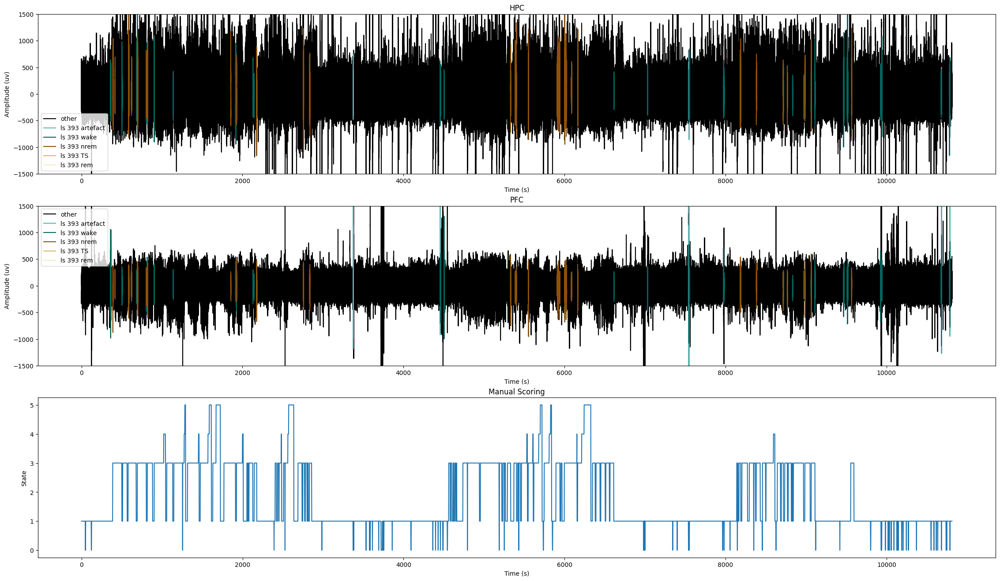

In [20]:
compare_raw_lfp(colors, hpc_, pfc_, color_to_name_ls, y_lim = [-1500, 1500])

In [19]:
compare_raw_lfp_plotly(color_ls, color_to_name_ls, 350, 600)